In [64]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split    
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV



from matplotlib.offsetbox import AnchoredText
from statsmodels.graphics.tsaplots import plot_pacf
import seaborn as sns
import math

In [79]:
df_avg_consumption = pd.read_csv(r"E:\Projects\Python\Predicting_Energy_Consumption_dataset\df_avg_consumption.csv")

In [80]:
def plot_lag(x, lag=1, ax=None, **kwargs):
    x_ = x.shift(lag)
    y_ = x
    if ax is None:
        fig, ax = plt.subplots()
    scatter_kws = dict(
        alpha=0.75,
        s=3,
    )
    line = dict(color='C3', )

    ax = sns.regplot(x=x_,
                     y=y_,
                     scatter_kws=scatter_kws,
                     line_kws=line,
                     lowess=True,
                     ax=ax,
                     **kwargs)
    
    # Adding correlation on plot
    at = AnchoredText(
        f"{y_.corr(x_):.2f}",
        prop=dict(size="large"),
        frameon=True,
        loc="upper left",
    )
    at.patch.set_boxstyle("square, pad=0.0")
    ax.add_artist(at)
    ax.set(title=f"Lag {lag}", xlabel=x_.name, ylabel=y_.name)
    return ax

def plot_autocorrelation(x, lags=6, lagplot_kwargs={}, **kwargs):
    kwargs.setdefault("nrows", 2)
    kwargs.setdefault("ncols", math.ceil(lags / 2))
    kwargs.setdefault("figsize", (kwargs["ncols"] * 2, 2  * 2 + 0.5))
    fig, axs = plt.subplots(sharex=True, sharey=True, squeeze=False, **kwargs)
    for ax, k in zip(fig.get_axes(), range(2 * kwargs["ncols"])):
        if k + 1 <= lags:
            ax = plot_lag(x, lag=k + 1, ax=ax, **lagplot_kwargs)
            ax.set_title(f"Lag #{k + 1}", fontdict=dict(fontsize=14))
            ax.set(xlabel="", ylabel="")
        else:
            ax.axis("off")
    plt.setp(axs[-1, :], xlabel=x.name)
    fig.tight_layout(w_pad=0.1, h_pad=0.1)
    return fig

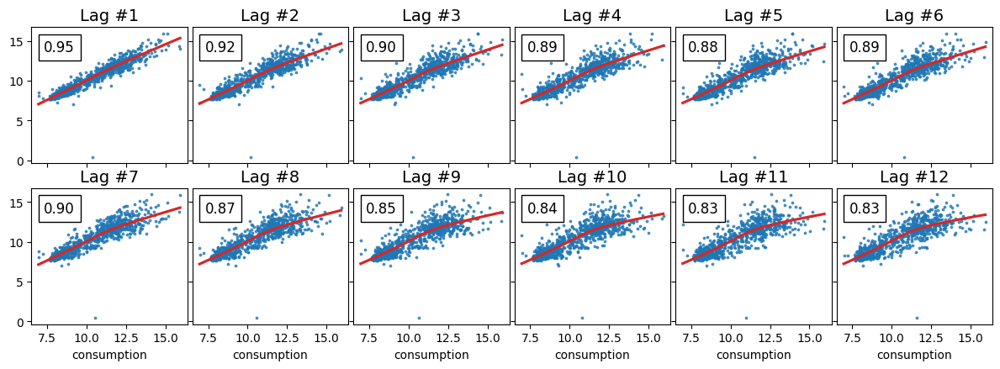

In [81]:
# Use the `df_avg_consumption` dataframe from the previous exercise
_= plot_autocorrelation(df_avg_consumption["consumption"], lags=12)
# df.columns.to_list()



## There is a relationship, mostly linear, between the target and its lags, where the correlation drops by approximately 1–2% when moving from one lag to another. These findings indicate that we would have some gains in the model performance if we use some lag features.

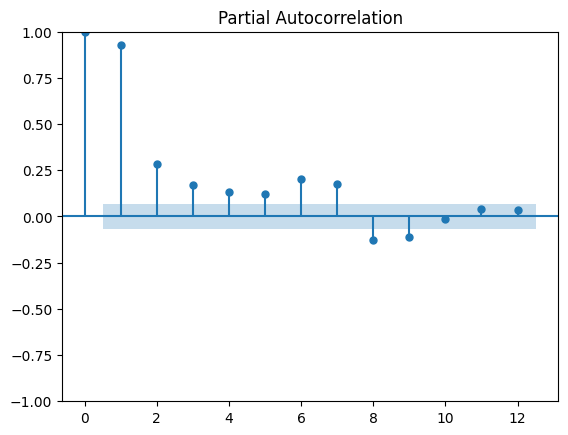

In [82]:
# check the partial autocorrelation plot to select Lag features


_ = plot_pacf(df["consumption"], lags=12)

## First 9 lags possibly contain valuable information since they’re out of the bluish area. This area is related to the confidence interval that was chosen in the `plot_pacf` function, with the default value being 95%.

## forecast the energy consumption from August of 2013 to March of 2014 by training on data from November of 2011 to July of 2013.
### We have run the following 3 experiments for each model:

### Using 4 lag features
### Using 9 lag features (partial autocorrelation plot marks this one as the best choice)
### Using 12 lag features

### XGBOOST : # Evaluating GridSearch results
#### OLD
##### MAE: 0.6945552799213122
##### MSE: 1.1221050931776586
##### MAPE: 0.18008041538449557
#### NEW
##### MAE: 0.3845299635646364
##### MSE: 0.7600326012342922
##### MAPE: 0.14778639384313833


### LightGBM : # Evaluating GridSearch results
#### OLD
##### MAE: 0.7018610022746371
##### MSE: 1.2147785749963933
##### MAPE: 0.177354179612452
#### NEW With weather
##### MAE: 0.41190749130574605
##### MSE: 0.7712307742767447
##### MAPE: 0.14975048189862875

In [83]:
# Inserting lag features
def create_lag_features(df, lags=2):
  y = df_avg_consumption.loc[:, "consumption"]
  for lag in range(lags):
    df[f"lag_{lag + 1}"] = y.shift(lag + 1)
  return df

In [84]:
df_avg_consumption = create_lag_features(df_avg_consumption, lags=4)

## XGBoost/LightGBM takes care of the NaN values

In [85]:

df_avg_consumption.head()

,date,consumption,day_of_week,day_of_year,month,year,quarter,cloud_cover,sunshine,global_radiation,max_temp,mean_temp,min_temp,precipitation,pressure,snow_depth,lag_1,lag_2,lag_3,lag_4
0,2011-11-23,6.952692,2,327,11,2011,4,7.0,2.0,35.0,13.5,6.8,2.6,0.2,102720.0,0.0,NaN,NaN,NaN,NaN
1,2011-11-24,8.536480,3,328,11,2011,4,3.0,2.0,35.0,12.5,8.6,3.7,0.2,102710.0,0.0,6.952692,NaN,NaN,NaN
2,2011-11-25,9.499781,4,329,11,2011,4,3.0,5.0,52.0,14.0,11.0,9.5,0.0,102450.0,0.0,8.536480,6.952692,NaN,NaN
3,2011-11-26,10.267707,5,330,11,2011,4,4.0,0.7,24.0,13.9,10.2,6.3,0.0,102580.0,0.0,9.499781,8.536480,6.952692,NaN
4,2011-11-27,10.850805,6,331,11,2011,4,3.0,5.9,55.0,13.2,11.8,9.7,0.0,102130.0,0.0,10.267707,9.499781,8.536480,6.952692


In [86]:
# testing set will use only the last 6 months. 
# If the training set was bigger we would have used the entire last year as the testing set.
training_mask = df_avg_consumption["date"] < "2013-07-01"
training_data = df_avg_consumption.loc[training_mask]
print(f"Train shape: {training_data.shape}")

testing_mask = df_avg_consumption["date"] >= "2013-07-01"
testing_data = df_avg_consumption.loc[testing_mask]

print(f"Test shape: {testing_data.shape}")

Train shape: (586, 20)
Test shape: (243, 20)


In [87]:
#Drop Date to create training and testing dataset
training_data = training_data.drop("date", axis=1)
testing_date = testing_data["date"]
testing_data = testing_data.drop("date", axis=1)

X_train = training_data[["day_of_week", "day_of_year", "month", "quarter", "year",\
                         "cloud_cover", "sunshine", "global_radiation", "max_temp",\
                         "mean_temp", "min_temp", "precipitation", "pressure",\
                         "snow_depth"]]
y_train = training_data["consumption"]


X_test = testing_data[["day_of_week", "day_of_year", "month", "quarter", "year",\
                         "cloud_cover", "sunshine", "global_radiation", "max_temp",\
                         "mean_temp", "min_temp", "precipitation", "pressure",\
                         "snow_depth"]]
y_test = testing_data["consumption"]

In [88]:
#XG_Boost
from sklearn.model_selection import  TimeSeriesSplit
from xgboost import XGBRegressor

cv_split = TimeSeriesSplit(n_splits=4,test_size=100)
XGBmodel = XGBRegressor()
param_grid = {
    "n_estimators": [100, 200, 300], #Represents the number of boosting rounds (i.e., the number of trees in the ensemble).
    "max_depth": [3, 4, 5], #Maximum depth of each tree in the model.
    "learning_rate": [0.01, 0.05, 0.1], #Controls the weight of new trees added to the model.
    "colsample_bytree": [0.6, 0.8, 1], #Fraction of features to use for training each tree.
}
 #grid search
from sklearn.model_selection import GridSearchCV


grid_searchXGboost = GridSearchCV(XGBmodel, param_grid, cv=cv_split, scoring="neg_mean_squared_error")
grid_searchXGboost= grid_searchXGboost.fit(X_train, y_train)

print(grid_searchXGboost.best_params_)
print(grid_searchXGboost.best_score_)
print(grid_searchXGboost.best_estimator_)

{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 300}
-0.5497461736545715
XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.05, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=3,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=300,
             n_jobs=None, num_parallel_tree=None, ...)


In [89]:
#LightGBM
import lightgbm as lgb

cv_split1 = TimeSeriesSplit(n_splits=5, test_size=100)
LightGBM_model= lgb.LGBMRegressor()
param_grid1 = {
    "n_estimators": [100, 300, 500],   #Represents the number of boosting rounds (i.e., the number of trees in the ensemble).
    "max_depth": [3, 5, 10], #Maximum depth of each tree in the model.
    "learning_rate": [0.01, 0.1, 0.2],  #Controls the weight of new trees added to the model.
    "colsample_bytree": [0.5, 1],   #Fraction of features to use for training each tree
    "num_leaves": [10, 50]  #Maximum number of leaves in one tree
}

grid_searchLGBM = GridSearchCV(LightGBM_model, param_grid1, cv=cv_split1)
grid_searchLGBM.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000053 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 226
[LightGBM] [Info] Number of data points in the train set: 86, number of used features: 13
[LightGBM] [Info] Start training from score 12.546941
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

GridSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=100),
             estimator=LGBMRegressor(),
             param_grid={'colsample_bytree': [0.5, 1],
                         'learning_rate': [0.01, 0.1, 0.2],
                         'max_depth': [3, 5, 10],
                         'n_estimators': [100, 300, 500],
                         'num_leaves': [10, 50]})

In [90]:
#Best parameters #LightGBM
print(grid_searchLGBM.best_params_)
print(grid_searchLGBM.best_score_)
print(grid_searchLGBM.best_estimator_)

{'colsample_bytree': 1, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500, 'num_leaves': 10}
-0.2720728461628084
LGBMRegressor(colsample_bytree=1, learning_rate=0.01, max_depth=3,
              n_estimators=500, num_leaves=10)


In [91]:

from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error,\
  mean_squared_error

def evaluate_model(y_test, prediction):
  print(f"MAE: {mean_absolute_error(y_test, prediction)}")
  print(f"MSE: {mean_squared_error(y_test, prediction)}")
  print(f"MAPE: {mean_absolute_percentage_error(y_test, prediction)}")

def plot_predictions(testing_dates, y_test, prediction):
  df_test = pd.DataFrame({"date": testing_dates, "actual": y_test, "prediction": prediction })
  figure, ax = plt.subplots(figsize=(10, 5))
  df_test.plot(ax=ax, label="Actual", x="date", y="actual")
  df_test.plot(ax=ax, label="Prediction", x="date", y="prediction")
  plt.legend(["Actual", "Prediction"])
  plt.show()

testing_data_1d = testing_data.iloc[:, 0].values  # Convert to 1D NumPy array

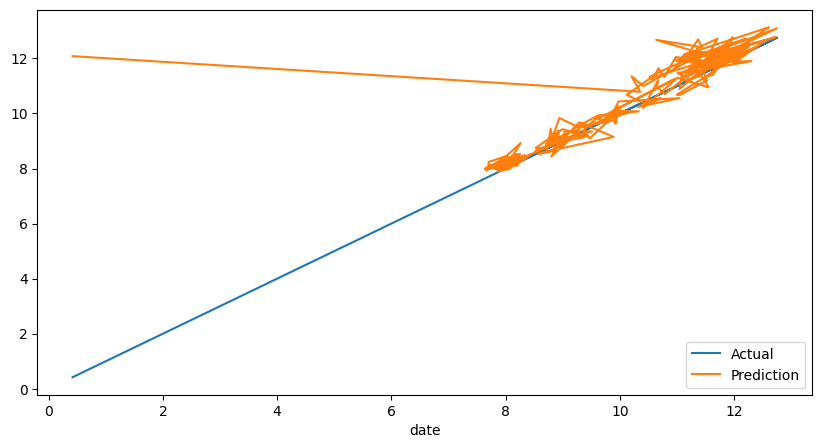

MAE: 0.38452996356463653
MSE: 0.7600326012342923
MAPE: 0.14778639384313833


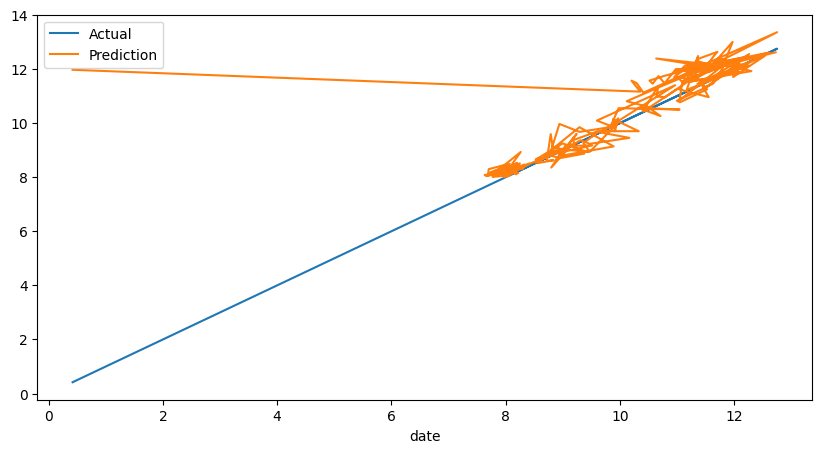

MAE: 0.4119074913057462
MSE: 0.7712307742767447
MAPE: 0.14975048189862875


In [92]:
# Evaluating XGBoost Gridsearch Results
prediction = grid_searchXGboost.predict(X_test)
plot_predictions(np.ravel(testing_data_1d), np.ravel(y_test), np.ravel(prediction))
evaluate_model(np.ravel(y_test), np.ravel(prediction))

# Evaluating LightGBM Gridsearch Results
prediction = grid_searchLGBM.predict(X_test)
plot_predictions(np.ravel(testing_data_1d), np.ravel(y_test), np.ravel(prediction))
evaluate_model(np.ravel(y_test), np.ravel(prediction))


## Baseline Model Results
### XGBOOST : # Evaluating GridSearch results
#### OLD
##### MAE: 0.6945552799213122
##### MSE: 1.1221050931776586
##### MAPE: 0.18008041538449557

#### NEW With weather                With Lag 12                            with Lag 9    
##### MAE: 0.3845299635646364        MAE: 0.38452996356463653               MAE: 0.38452996356463653
##### MSE: 0.7600326012342922        MSE: 0.7600326012342923                MSE: 0.7600326012342923
##### MAPE: 0.14778639384313833      MAPE: 0.14778639384313833              MAPE: 0.14778639384313833 


### LightGBM : # Evaluating GridSearch results
#### OLD
##### MAE: 0.7018610022746371
##### MSE: 1.2147785749963933
##### MAPE: 0.177354179612452

#### NEW With weather                With Lag 12                            with Lag 9
##### MAE: 0.41190749130574605       MAE: 0.4119074913057462                MAE: 0.4119074913057462
##### MSE: 0.7712307742767447        MSE: 0.7712307742767447                MSE: 0.7712307742767447
##### MAPE: 0.14975048189862875      MAPE: 0.14975048189862875              MAPE: 0.14975048189862875

In [93]:
df_avg_consumption.to_csv(r"E:\Projects\Python\Predicting_Energy_Consumption_dataset\df_avg_consumption2.csv", index=False)
